In [ ]:
import os
import gc
import torch
import numpy as np
from PIL import Image
from transformers import pipeline
import matplotlib.pyplot as plt

block_grips_dir = '../data/block_grips/'
img_paths = [os.path.join(block_grips_dir, f) for f in os.listdir(block_grips_dir) if f.endswith('.jpg')]
imgs = {}

for path in img_paths:
    img = Image.open(path).convert('RGB')
    img.load() 
    imgs[os.path.basename(path)] = img


def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

# Depth Anything V2
model_ids = [
    'depth-anything/Depth-Anything-V2-Small-hf',
    'depth-anything/Depth-Anything-V2-Base-hf',
    'depth-anything/Depth-Anything-V2-Large-hf'
]
depths_v2 = {m: {} for m in model_ids}
for model_id in model_ids:
    pipe = pipeline(
        task="depth-estimation", 
        model=model_id, 
        device=0 if torch.cuda.is_available() else -1
    )
    print(f"Model {model_id} has {count_parameters(pipe.model):,} trainable parameters.")
    for f, img in imgs.items():
        result = pipe(img)
        depths_v2[model_id][f] = torch.from_numpy(np.array(result["depth"]))
    del pipe
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    gc.collect()

# Depth Anything V3
# NOTE: need to run:
"""
git clone https://github.com/ByteDance-Seed/depth-anything-3
cd depth-anything-3
pip install -e .
"""
import sys; sys.path.append('../depth-anything-3')
from depth_anything_3.api import DepthAnything3
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_ids = [
    "depth-anything/da3-small",
    "depth-anything/da3-base",
    "depth-anything/da3-large"
]
depths_v3 = {m: {} for m in model_ids}
for model_id in model_ids:
    model = DepthAnything3.from_pretrained(model_id).to(device)
    print(f"Model {model_id} has {count_parameters(model):,} trainable parameters.")
    prediction = model.inference(img_paths)
    for i, f in enumerate(imgs.keys()):
        if f not in imgs:
            imgs[f] = Image.open(img_paths[i]).convert('RGB')
        depth = prediction.depth[i]
        # Normalize to 0-1 range, scale to 0-255, and convert to uint8
        d_min, d_max = depth.min(), depth.max()
        depth_norm = (255 * (depth - d_min) / (d_max - d_min)).astype(np.uint8)
        depth_norm = 255 - depth_norm
        depths_v3[model_id][f] = depth_norm
    
    del model
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

In [23]:
list(list(depths_v2.values())[0].values())[0]

tensor([[  1,   1,   1,  ..., 248, 226, 195],
        [  1,   1,   1,  ..., 243, 231, 214],
        [  1,   1,   1,  ..., 241, 238, 235],
        ...,
        [  2,   2,   1,  ..., 232, 231, 230],
        [  2,   2,   1,  ..., 231, 231, 230],
        [  1,   2,   2,  ..., 231, 231, 230]], dtype=torch.uint8)

In [29]:
list(list(depths_v3.values())[0].values())[0]

array([[ 16,  19,  19, ..., 238, 238, 229],
       [ 31,  24,  23, ..., 239, 240, 238],
       [ 20,  25,  21, ..., 239, 240, 239],
       ...,
       [ 42,  37,  39, ..., 252, 253, 255],
       [ 50,  38,  37, ..., 253, 253, 253],
       [106,  67,  50, ..., 253, 254, 252]], dtype=uint8)

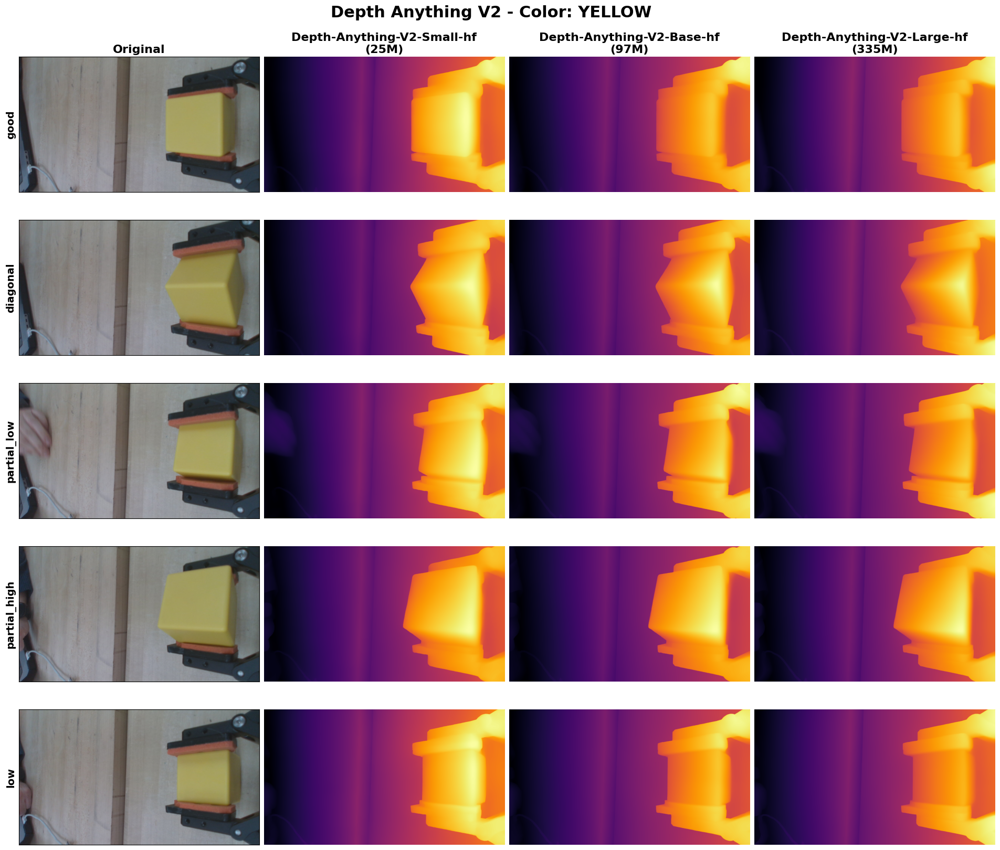

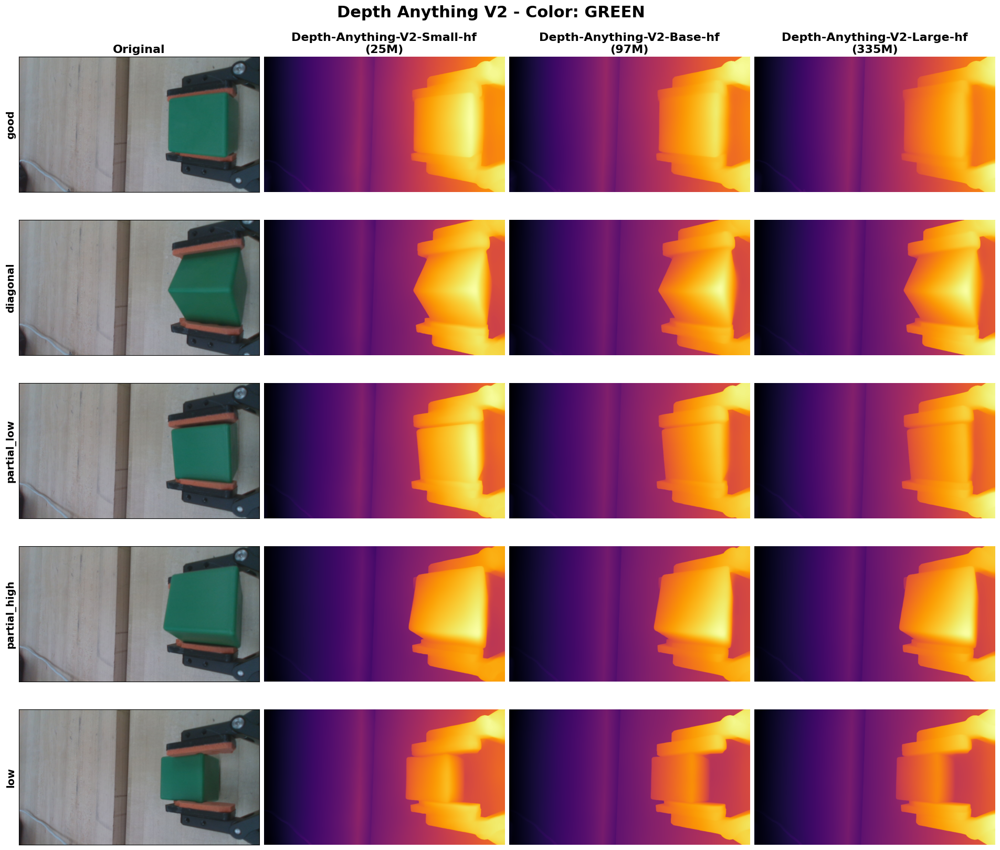

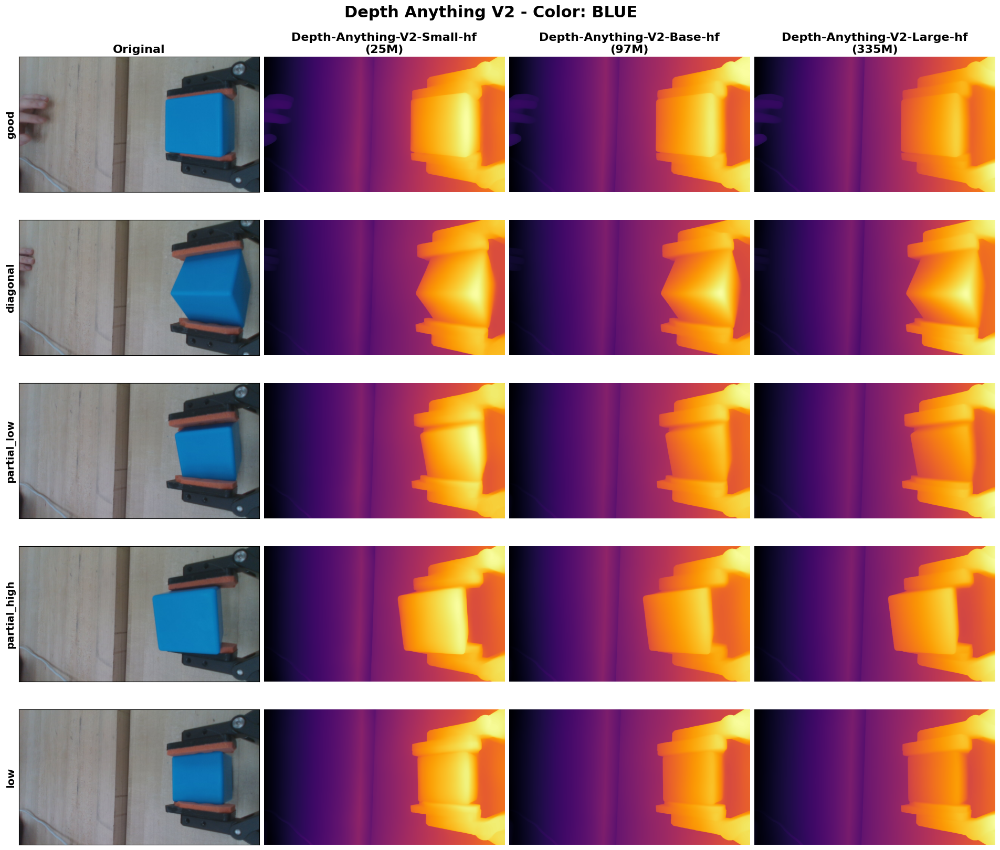

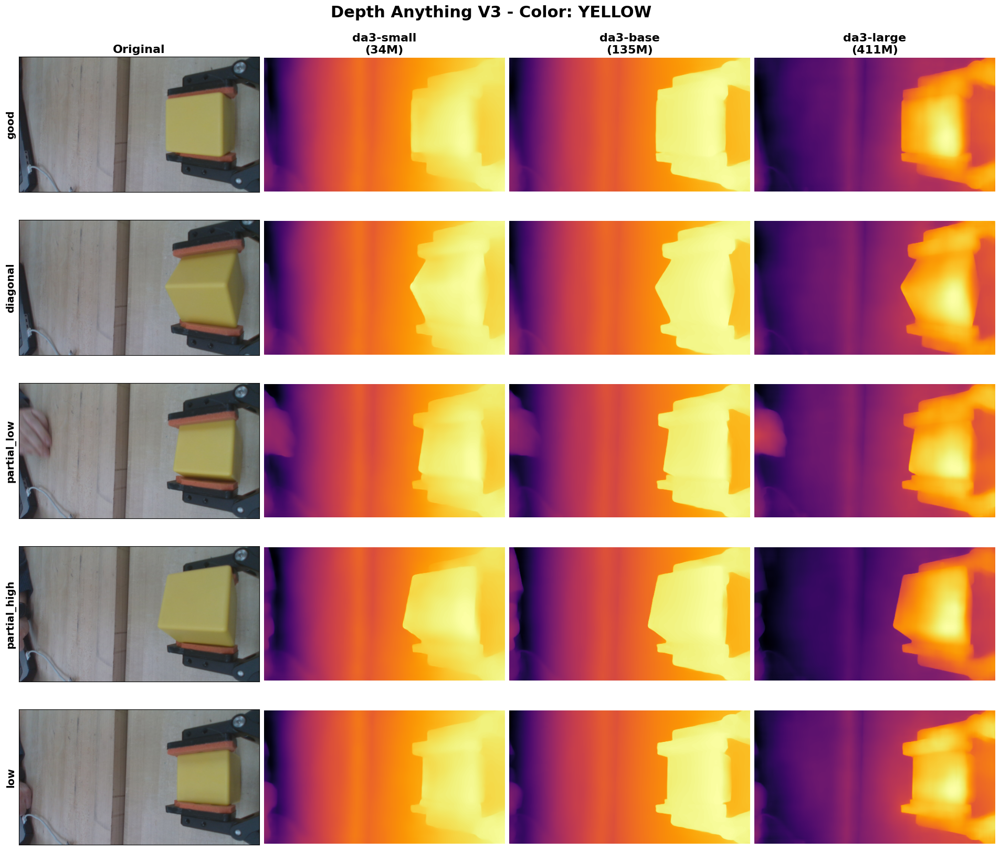

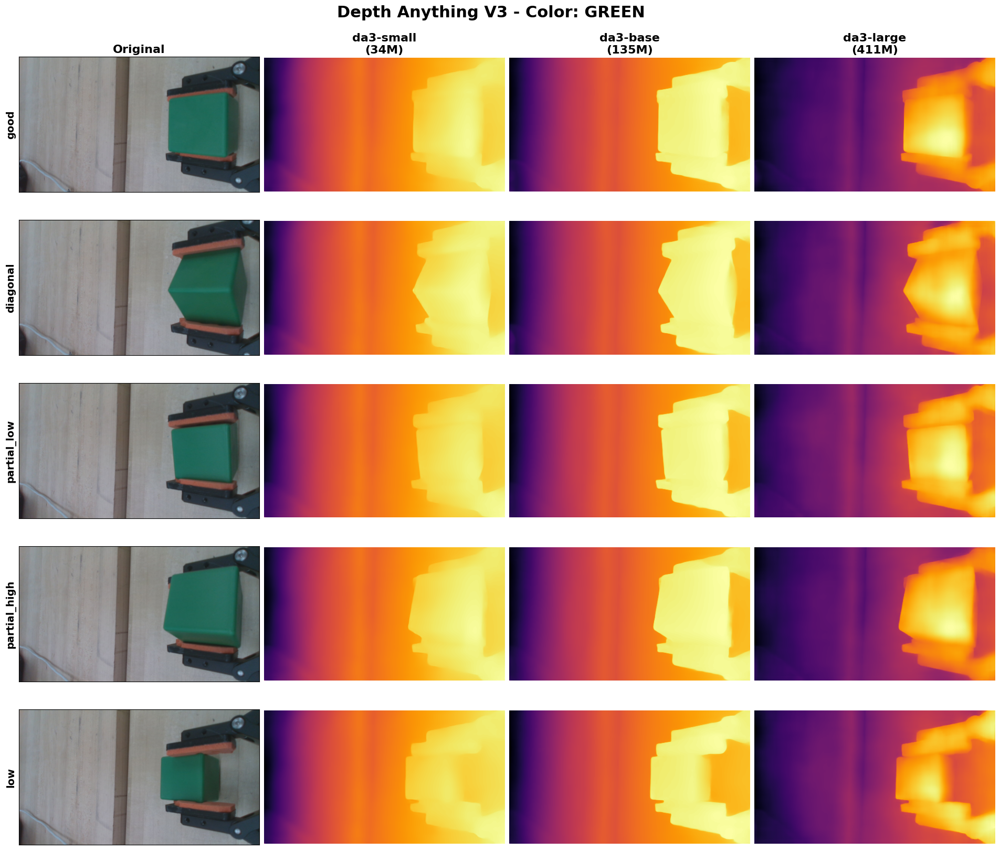

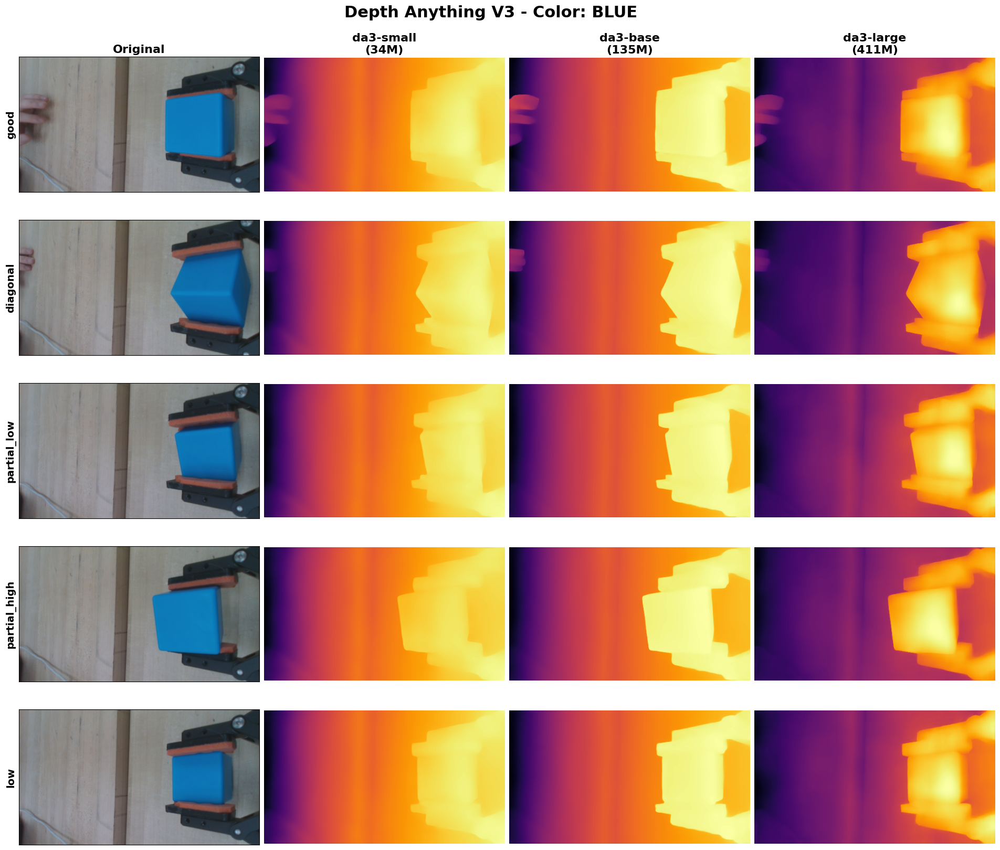

In [30]:
import matplotlib.pyplot as plt

colors = ['yellow', 'green', 'blue']
modes = ['good', 'diagonal', 'partial_low', 'partial_high', 'low']

# Configuration for both versions
versions = [
    {
        'name': 'v2',
        'data': depths_v2,
        'model_list': [
            ('depth-anything/Depth-Anything-V2-Small-hf', '25M'),
            ('depth-anything/Depth-Anything-V2-Base-hf', '97M'),
            ('depth-anything/Depth-Anything-V2-Large-hf', '335M')
        ]
    },
    {
        'name': 'v3',
        'data': depths_v3,
        'model_list': [
            ("depth-anything/da3-small", '34M'),
            ("depth-anything/da3-base", '135M'),
            ("depth-anything/da3-large", '411M')
        ]
    }
]

for v_info in versions:
    v_name = v_info['name']
    v_data = v_info['data']
    v_models = v_info['model_list']

    for color in colors:
        fig, axes = plt.subplots(
            nrows=len(modes), 
            ncols=4, 
            figsize=(24, 4 * len(modes)),
            gridspec_kw={'hspace': 0.05, 'wspace': 0.02}
        )
        fig.suptitle(f"Depth Anything {v_name.upper()} - Color: {color.upper()}", fontsize=22, weight='bold', y=0.92)

        for row_idx, mode in enumerate(modes):
            f = f"{color}-{mode}.jpg"
            
            if f not in imgs:   
                continue

            # Column 0: Original
            axes[row_idx, 0].imshow(imgs[f])
            if row_idx == 0:
                axes[row_idx, 0].set_title("Original", fontsize=16, weight='bold')
            axes[row_idx, 0].set_ylabel(mode, fontsize=14, weight='bold')
            axes[row_idx, 0].set_xticks([])
            axes[row_idx, 0].set_yticks([])
            
            # Columns 1-3: Model Sizes
            for col_idx, (model_id, p_count) in enumerate(v_models):
                ax = axes[row_idx, col_idx + 1]
                
                # Retrieve depth and move to CPU numpy
                depth_array = v_data[model_id][f]
                if torch.is_tensor(depth_array):
                    depth_array = depth_array.cpu().numpy()
                
                ax.imshow(depth_array, cmap='inferno')
                
                if row_idx == 0:
                    model_short_name = model_id.split('/')[-1]
                    ax.set_title(f"{model_short_name}\n({p_count})", fontsize=16, weight='bold')
                ax.axis('off')
        
        save_path = f"../data/block_grips/depths/depth_comparison_{color}-depth_anything_{v_name}.jpg"
        plt.savefig(save_path, bbox_inches='tight', dpi=150)
        plt.show()
        plt.close(fig)

In [18]:
depth_array

array([[1.1143222 , 1.1197276 , 1.1173868 , ..., 0.7871673 , 0.7826023 ,
        0.7729481 ],
       [1.121788  , 1.1177788 , 1.1151693 , ..., 0.7850326 , 0.7835374 ,
        0.7730907 ],
       [1.1176482 , 1.1137908 , 1.113375  , ..., 0.7833292 , 0.7809542 ,
        0.77523696],
       ...,
       [1.0614562 , 1.0645419 , 1.0693722 , ..., 0.77322984, 0.7765906 ,
        0.771469  ],
       [1.063902  , 1.0629418 , 1.0689195 , ..., 0.77513206, 0.77781916,
        0.76861024],
       [1.0718838 , 1.080806  , 1.0737704 , ..., 0.77015686, 0.77141947,
        0.7786768 ]], dtype=float32)